In [ ]:
# --- Data Classes for Behavioral and Ephys Data ---
from dataclasses import dataclass, field
from typing import List, Dict, Optional, Any
import numpy as np
import scipy.io
import os
import vis_detect_helpers_EPHYS_August2025 as hp

from vis_detect_helpers_EPHYS_August2025 import load_session_from_file
from vis_detect_helpers_EPHYS_August2025 import Session, Trial, Cluster



In [ ]:
session = hp.load_mat_file_to_session('E:/python_analysis/git_repos/vis_detect_analysis_Sep2025/data/BG_031_260325.mat')

In [ ]:
session = hp.load_session_from_file('E:/python_analysis/git_repos/vis_detect_analysis_Apr2023/pkls/BG_031_260325.pkl')  # Load session data from a file

In [ ]:
session.trials[0].trialoutcome  # Accessing trial outcome
# session.clusters[0].cluster_id  # Accessing cluster ID  

'abort'

In [ ]:
len(session.clusters[0].spike_times)  # Accessing spike times of the first cluster
# session.clusters[0].quality  # Accessing quality of the first cluster (if

45135

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def get_true_reaction_time(trial, ni_events, trial_idx, shift_fa_hit_ms=200.0):
    outcome = trial.trialoutcome if hasattr(trial, 'trialoutcome') else trial.get('trialoutcome', None)
    reactiontimes = trial.reactiontimes if hasattr(trial, 'reactiontimes') else trial.get('reactiontimes', {})
    # Get Baseline_ON time
    if 'Baseline_ON' in ni_events:
        baseline_on = ni_events['Baseline_ON']
        if isinstance(baseline_on, dict) and 'rise_t' in baseline_on:
            baseline_on_times = np.array(baseline_on['rise_t']).flatten()
        else:
            baseline_on_times = np.array(baseline_on).flatten()
        t0 = baseline_on_times[trial_idx]
    else:
        return None
    # Get Change_ON time (if available)
    if 'Change_ON' in ni_events:
        change_on = ni_events['Change_ON']
        if isinstance(change_on, dict) and 'rise_t' in change_on:
            change_on_times = np.array(change_on['rise_t']).flatten()
        else:
            change_on_times = np.array(change_on).flatten()
        t_change = change_on_times[trial_idx] if trial_idx < len(change_on_times) else None
    else:
        t_change = None
    # Compute true reaction time
    shift = 0.0
    if outcome in ['FA', 'Hit']:
        shift = shift_fa_hit_ms / 1000.0  # convert ms to s
    if outcome == 'Hit':
        rt = reactiontimes.get('RT', np.nan)
        if not np.isnan(rt) and t_change is not None:
            return t_change + rt - shift
        else:
            return None
    elif outcome == 'Miss':
        rt = reactiontimes.get('Miss', np.nan)
        if not np.isnan(rt) and t_change is not None:
            return t_change + rt
        else:
            return None
    elif outcome in ['FA', 'abort']:
        rt = reactiontimes.get(outcome, np.nan)
        if not np.isnan(rt):
            return t0 + rt - shift if outcome == 'FA' else t0 + rt
        else:
            return None
    else:
        return None



In [ ]:
import os
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
import logging

def plot_psth_per_cluster_per_outcome(
    session,
    outcomes=None,
    window=(-0.5, 1.0),
    bin_size=0.01,
    good_cluster_ids=None,
    output_dir='png_output',
    show_fig=False,
    min_trials_with_spikes=30,
    shift_fa_hit_ms=200.0,
    smoothing_sigma=0.1,
    min_mean_firing_rate=1.0,
    min_peak_firing_rate=2.0
):
    """
    Plot PSTHs for each good cluster, for all outcomes (excluding 'Ref'), Baseline_ON, and Change_ON split by change size.
    Only plots outcomes/change sizes with at least min_trials_with_spikes trials and sufficient firing rate.
    """
    def get_event_times(trials, ni_events, outcome, idx=None, shift_fa_hit_ms=200.0):
        if outcome == 'Change_ON':
            change_on = ni_events.get('Change_ON', None)
            if change_on is None:
                return None
            if isinstance(change_on, dict) and 'rise_t' in change_on:
                return np.array(change_on['rise_t']).flatten()
            return np.array(change_on).flatten()
        elif outcome == 'Baseline_ON':
            baseline_on = ni_events.get('Baseline_ON', None)
            if baseline_on is None:
                return None
            if isinstance(baseline_on, dict) and 'rise_t' in baseline_on:
                return np.array(baseline_on['rise_t']).flatten()
            return np.array(baseline_on).flatten()
        else:
            event_times = []
            for idx, t in enumerate(trials):
                if t.trialoutcome == outcome:
                    et = get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                    if et is not None and not np.isnan(et):
                        event_times.append(et)
            return np.array(event_times)

    def compute_smoothed_psth(spike_times, event_times, window, bin_size, sigma):
        bins = np.arange(window[0], window[1] + bin_size, bin_size)
        all_counts = []
        for t_event in event_times:
            aligned_spikes = spike_times - t_event
            mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
            counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
            smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
            all_counts.append(smoothed_counts)
        if len(all_counts) == 0:
            return np.empty((0, len(bins)-1))
        return np.atleast_2d(np.array(all_counts))

    def plot_psth(ax, bins, mean_psth, color='k', label=None):
        ax.step(bins[:-1], mean_psth, where='post', color=color, label=label)
        ax.axvline(0, color='r', linestyle='--', lw=0.8)
        if label:
            ax.legend(fontsize=8)

    change_size_colors = {
        1.25: "#FFF2B1",
        1.35: "#ff8c00",
        1.5: "#ff6347",
        2.0: "#e60000",
        4.0: "#990000"
    }

    if not hasattr(session, 'trials') or not hasattr(session, 'clusters'):
        logging.error("Session object missing required attributes.")
        return
    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        logging.warning('NI_events not found in session. Cannot align to true event times.')
        return

    if outcomes is None:
        outcomes = sorted(set(t.trialoutcome for t in session.trials if t.trialoutcome != 'Ref'))
    else:
        outcomes = [o for o in outcomes if o != 'Ref']
    extra_alignments = ['Baseline_ON', 'Change_ON']
    all_outcomes = outcomes + extra_alignments

    if good_cluster_ids is None:
        if hasattr(session, 'good_cluster_ids') and session.good_cluster_ids is not None:
            good_cluster_ids = list(session.good_cluster_ids)
        else:
            good_cluster_ids = [c.cluster_id for c in session.clusters]

    Path(output_dir).mkdir(parents=True, exist_ok=True)

    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue

        all_counts_per_outcome = []
        n_trials_per_outcome = []

        for outcome in all_outcomes:
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            if outcome == 'Change_ON':
                change_sizes = sorted(set(
                    t.change_size for t in session.trials
                    if t.change_size is not None and not np.isnan(t.change_size)
                ))
                if not change_sizes:
                    all_counts_per_outcome.append({})
                    n_trials_per_outcome.append({})
                    continue
                psth_by_size = {}
                n_trials_by_size = {}
                change_on_times = get_event_times(session.trials, ni_events, 'Change_ON')
                for cs in change_sizes:
                    trial_indices = [i for i, t in enumerate(session.trials) if t.change_size == cs]
                    event_times = change_on_times[trial_indices] if len(trial_indices) > 0 else []
                    psth = compute_smoothed_psth(cluster.spike_times, event_times, window, bin_size, smoothing_sigma)
                    n_trials = len(event_times)
                    if n_trials < min_trials_with_spikes:
                        continue  # Skip this change size
                    mean_psth = np.mean(psth, axis=0) / bin_size if psth.shape[0] > 0 else np.zeros(len(bins)-1)
                    if np.mean(mean_psth) < min_mean_firing_rate or np.max(mean_psth) < min_peak_firing_rate:
                        continue  # Skip low-activity change size
                    psth_by_size[cs] = mean_psth
                    n_trials_by_size[cs] = n_trials
                all_counts_per_outcome.append(psth_by_size)
                n_trials_per_outcome.append(n_trials_by_size)
            elif outcome == 'Baseline_ON':
                baseline_on_times = get_event_times(session.trials, ni_events, 'Baseline_ON')
                trial_indices = list(range(len(session.trials)))
                event_times = baseline_on_times[trial_indices] if len(trial_indices) > 0 else []
                n_trials = len(event_times)
                psth = compute_smoothed_psth(cluster.spike_times, event_times, window, bin_size, smoothing_sigma)
                if n_trials < min_trials_with_spikes or psth.shape[0] == 0:
                    all_counts_per_outcome.append(None)
                    n_trials_per_outcome.append(0)
                else:
                    mean_psth = np.mean(psth, axis=0) / bin_size
                    if np.mean(mean_psth) < min_mean_firing_rate or np.max(mean_psth) < min_peak_firing_rate:
                        all_counts_per_outcome.append(None)
                        n_trials_per_outcome.append(0)
                    else:
                        all_counts_per_outcome.append(psth)
                        n_trials_per_outcome.append(n_trials)
            else:
                event_times = get_event_times(session.trials, ni_events, outcome, shift_fa_hit_ms=shift_fa_hit_ms)
                n_trials = len(event_times)
                psth = compute_smoothed_psth(cluster.spike_times, event_times, window, bin_size, smoothing_sigma)
                if n_trials < min_trials_with_spikes or psth.shape[0] == 0:
                    all_counts_per_outcome.append(None)
                    n_trials_per_outcome.append(0)
                else:
                    mean_psth = np.mean(psth, axis=0) / bin_size
                    if np.mean(mean_psth) < min_mean_firing_rate or np.max(mean_psth) < min_peak_firing_rate:
                        all_counts_per_outcome.append(None)
                        n_trials_per_outcome.append(0)
                    else:
                        all_counts_per_outcome.append(psth)
                        n_trials_per_outcome.append(n_trials)

        # Check if there is at least one outcome/change size to plot
        has_valid = False
        for i, counts in enumerate(all_counts_per_outcome):
            if all_outcomes[i] == 'Change_ON':
                if any(n >= min_trials_with_spikes for n in n_trials_per_outcome[i].values()):
                    has_valid = True
            else:
                if counts is not None:
                    has_valid = True
        if not has_valid:
            continue  # Skip this cluster entirely

        # Plotting
        fig, axes = plt.subplots(1, len(all_outcomes), figsize=(min(3*len(all_outcomes), 18), 3), sharey=True)
        if len(all_outcomes) == 1:
            axes = [axes]
        for i, (outcome, counts, n_trials) in enumerate(zip(all_outcomes, all_counts_per_outcome, n_trials_per_outcome)):
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            ax = axes[i]
            if outcome == 'Change_ON':
                if not counts:
                    ax.set_visible(False)
                    continue
                for cs in sorted(counts.keys()):
                    color = change_size_colors.get(cs, None)
                    if color is None:
                        color = plt.cm.coolwarm((cs - min(counts.keys())) / (max(counts.keys()) - min(counts.keys())))
                    label = f'{cs} Hz (n={n_trials[cs]})'
                    plot_psth(ax, bins, counts[cs], color=color, label=label)
            else:
                if counts is None:
                    ax.set_visible(False)
                    continue
                mean_psth = np.mean(counts, axis=0) / bin_size
                plot_psth(ax, bins, mean_psth)
            ax.set_title(f'{outcome}')
            ax.set_xlabel('Time from event (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')
        fig.suptitle(f'Cluster {cluster.cluster_id}')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        save_path = Path(output_dir) / f'cluster_{cluster.cluster_id}_psth.png'
        plt.savefig(save_path, dpi=120)
        if show_fig:
            plt.show()
        plt.close(fig)


In [ ]:
# --- Updated PSTH plotting: Change_ON split by change size --- No smoothing
def plot_psth_per_cluster_per_outcome(
    session, 
    outcomes=None, 
    window=(-0.5, 1.0), 
    bin_size=0.01, 
    good_cluster_ids=None, 
    output_dir='png_output', 
    show_fig=False, 
    min_trials_with_spikes=30, 
    shift_fa_hit_ms=200.0
):
    change_size_colors = {
    1.25: "#FFF2B1",
    1.35: "#ff8c00",
    1.5: "#ff6347",
    2.0: "#e60000",
    4.0: "#990000"
}
    """
    For each good cluster, plot PSTHs for all outcomes (excluding 'Ref'), Baseline_ON, and for Change_ON split by change size.
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt

    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        print('NI_events not found in session. Cannot align to true event times.')
        return

    # Get all outcomes, exclude 'Ref'
    if outcomes is None:
        outcomes = sorted(set(t.trialoutcome for t in session.trials if t.trialoutcome != 'Ref'))
    else:
        outcomes = [o for o in outcomes if o != 'Ref']

    # Add pseudo-outcomes for Baseline_ON and Change_ON
    extra_alignments = ['Baseline_ON', 'Change_ON']
    all_outcomes = outcomes + extra_alignments

    if good_cluster_ids is None:
        if hasattr(session, 'good_cluster_ids') and session.good_cluster_ids is not None:
            good_cluster_ids = list(session.good_cluster_ids)
        else:
            good_cluster_ids = [c.cluster_id for c in session.clusters]

    os.makedirs(output_dir, exist_ok=True)
    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue
        all_counts_per_outcome = []
        n_trials_per_outcome = []
        for outcome in all_outcomes:
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            if outcome == 'Change_ON':
                # --- Split by change size, using trial indices to extract correct Change_ON times ---
                change_sizes = sorted(set(t.change_size for t in session.trials if t.change_size is not None))
                if not change_sizes:
                    all_counts_per_outcome.append({})
                    n_trials_per_outcome.append({})
                    continue  # Skip if no change sizes found

                color_map = plt.cm.coolwarm
                norm = plt.Normalize(min(change_sizes), max(change_sizes))
                psth_by_size = {}
                n_trials_by_size = {}
                # Get all Change_ON times from NI_events
                change_on = ni_events['Change_ON']
                if isinstance(change_on, dict) and 'rise_t' in change_on:
                    change_on_times = np.array(change_on['rise_t']).flatten()
                else:
                    change_on_times = np.array(change_on).flatten()
                for cs in change_sizes:
                    # Get indices of trials with this change size
                    trial_indices = [i for i, t in enumerate(session.trials) if t.change_size == cs]
                    event_times = change_on_times[trial_indices] if len(trial_indices) > 0 else []
                    all_counts = []
                    for t_event in event_times:
                        aligned_spikes = cluster.spike_times - t_event
                        mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                        counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                        all_counts.append(counts)
                    if len(all_counts) == 0:
                        mean_psth = np.zeros(len(bins)-1)
                    else:
                        mean_psth = np.mean(np.array(all_counts), axis=0) / bin_size
                    psth_by_size[cs] = mean_psth
                    n_trials_by_size[cs] = len(event_times)
                all_counts_per_outcome.append(psth_by_size)
                n_trials_per_outcome.append(n_trials_by_size)

            elif outcome == 'Baseline_ON':
                # --- Use trial indices to extract correct Baseline_ON times ---
                baseline_on = ni_events['Baseline_ON']
                if isinstance(baseline_on, dict) and 'rise_t' in baseline_on:
                    baseline_on_times = np.array(baseline_on['rise_t']).flatten()
                else:
                    baseline_on_times = np.array(baseline_on).flatten()
                trial_indices = list(range(len(session.trials)))
                event_times = baseline_on_times[trial_indices] if len(trial_indices) > 0 else []
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    all_counts.append(counts)
                if len(all_counts) == 0:
                    all_counts = np.empty((0, len(bins)-1))
                else:
                    all_counts = np.atleast_2d(np.array(all_counts))
                all_counts_per_outcome.append(all_counts)
                n_trials_per_outcome.append(len(event_times))
            else:
                # Align to behavioral outcome as before
                event_times = []
                for idx, t in enumerate(session.trials):
                    if t.trialoutcome == outcome:
                        et = get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                        if et is not None and not np.isnan(et):
                            event_times.append(et)
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    all_counts.append(counts)
                if len(all_counts) == 0:
                    all_counts = np.empty((0, len(bins)-1))
                else:
                    all_counts = np.atleast_2d(np.array(all_counts))
                all_counts_per_outcome.append(all_counts)
                n_trials_per_outcome.append(len(event_times))
        # Robust check for enough spikes (skip for Change_ON since it's dict)
        enough_spikes = False
        for i, counts in enumerate(all_counts_per_outcome):
            if all_outcomes[i] == 'Change_ON':
                if any(n >= min_trials_with_spikes for n in n_trials_per_outcome[i].values()):
                    enough_spikes = True
            else:
                if counts.shape[0] > 0 and np.sum(np.sum(counts, axis=1) > 0) >= min_trials_with_spikes:
                    enough_spikes = True
        if not enough_spikes:
            continue
        fig, axes = plt.subplots(1, len(all_outcomes), figsize=(3*len(all_outcomes), 3), sharey=False)
        if len(all_outcomes) == 1:
            axes = [axes]
        for i, (outcome, counts, n_trials) in enumerate(zip(all_outcomes, all_counts_per_outcome, n_trials_per_outcome)):
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            ax = axes[i]
            if outcome == 'Change_ON':
                # Plot one line per change size
                for cs in sorted(counts.keys()):
                    if cs == 1:  # No change, keep default color
                        color = 'b'
                    else:
                        color = change_size_colors.get(cs, 'k')  # fallback to black if not found
                    label = f'{cs} Hz (n={n_trials[cs]})'
                    ax.plot(bins[:-1], counts[cs], color=color, label=label)
                # ax.legend(fontsize=8)
            else:
                if counts.shape[0] > 0:
                    mean_psth = np.mean(counts, axis=0) / bin_size
                    ax.step(bins[:-1], mean_psth, where='post', color='k')
            ax.axvline(0, color='r', linestyle='--', lw=0.8)
            ax.set_title(f'{outcome}')
            ax.set_xlabel('Time from event (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')
        fig.suptitle(f'Cluster {cluster.cluster_id}')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        save_path = os.path.join(output_dir, f'cluster_{cluster.cluster_id}_psth.png')
        plt.savefig(save_path, dpi=120)
        if show_fig:
            plt.show()
        plt.close(fig)


In [ ]:
# --- Updated PSTH plotting: Change_ON split by change size --- W smoothing
def plot_psth_per_cluster_per_outcome(
    session, 
    outcomes=None, 
    window=(-0.5, 1.0), 
    bin_size=0.01, 
    good_cluster_ids=None, 
    output_dir='png_output', 
    show_fig=False, 
    min_trials_with_spikes=30, 
    shift_fa_hit_ms=200.0
):
    change_size_colors = {
    1.25: "#FFF2B1",
    1.35: "#ff8c00",
    1.5: "#ff6347",
    2.0: "#e60000",
    4.0: "#990000"
}
    
    """
    For each good cluster, plot PSTHs for all outcomes (excluding 'Ref'), Baseline_ON, and for Change_ON split by change size.
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.ndimage import gaussian_filter1d

    # Set your smoothing parameter (adjust as needed)
    sigma = 0.1  # e.g., 1 bin; increase for more smoothing

    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        print('NI_events not found in session. Cannot align to true event times.')
        return

    # Get all outcomes, exclude 'Ref'
    if outcomes is None:
        outcomes = sorted(set(t.trialoutcome for t in session.trials if t.trialoutcome != 'Ref'))
    else:
        outcomes = [o for o in outcomes if o != 'Ref']

    # Add pseudo-outcomes for Baseline_ON and Change_ON
    extra_alignments = ['Baseline_ON', 'Change_ON']
    all_outcomes = outcomes + extra_alignments

    if good_cluster_ids is None:
        if hasattr(session, 'good_cluster_ids') and session.good_cluster_ids is not None:
            good_cluster_ids = list(session.good_cluster_ids)
        else:
            good_cluster_ids = [c.cluster_id for c in session.clusters]

    os.makedirs(output_dir, exist_ok=True)
    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue
        all_counts_per_outcome = []
        n_trials_per_outcome = []
        for outcome in all_outcomes:
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            if outcome == 'Change_ON':
                # --- Split by change size, using trial indices to extract correct Change_ON times ---
                change_sizes = sorted(set(t.change_size for t in session.trials if t.change_size is not None))
                if not change_sizes:
                    all_counts_per_outcome.append({})
                    n_trials_per_outcome.append({})
                    continue  # Skip if no change sizes found

                color_map = plt.cm.coolwarm
                norm = plt.Normalize(min(change_sizes), max(change_sizes))
                psth_by_size = {}
                n_trials_by_size = {}
                # Get all Change_ON times from NI_events
                change_on = ni_events['Change_ON']
                if isinstance(change_on, dict) and 'rise_t' in change_on:
                    change_on_times = np.array(change_on['rise_t']).flatten()
                else:
                    change_on_times = np.array(change_on).flatten()
                for cs in change_sizes:
                    # Get indices of trials with this change size
                    trial_indices = [i for i, t in enumerate(session.trials) if t.change_size == cs]
                    event_times = change_on_times[trial_indices] if len(trial_indices) > 0 else []
                    all_counts = []
                    for t_event in event_times:
                        aligned_spikes = cluster.spike_times - t_event
                        mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                        counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                        smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
                        all_counts.append(smoothed_counts)
                    if len(all_counts) == 0:
                        mean_psth = np.zeros(len(bins)-1)
                    else:
                        mean_psth = np.mean(np.array(all_counts), axis=0) / bin_size
                    psth_by_size[cs] = mean_psth
                    n_trials_by_size[cs] = len(event_times)
                all_counts_per_outcome.append(psth_by_size)
                n_trials_per_outcome.append(n_trials_by_size)

            elif outcome == 'Baseline_ON':
                # --- Use trial indices to extract correct Baseline_ON times ---
                baseline_on = ni_events['Baseline_ON']
                if isinstance(baseline_on, dict) and 'rise_t' in baseline_on:
                    baseline_on_times = np.array(baseline_on['rise_t']).flatten()
                else:
                    baseline_on_times = np.array(baseline_on).flatten()
                trial_indices = list(range(len(session.trials)))
                event_times = baseline_on_times[trial_indices] if len(trial_indices) > 0 else []
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
                    all_counts.append(smoothed_counts)
                if len(all_counts) == 0:
                    all_counts = np.empty((0, len(bins)-1))
                else:
                    all_counts = np.atleast_2d(np.array(all_counts))
                all_counts_per_outcome.append(all_counts)
                n_trials_per_outcome.append(len(event_times))
            else:
                # Align to behavioral outcome as before
                event_times = []
                for idx, t in enumerate(session.trials):
                    if t.trialoutcome == outcome:
                        et = get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                        if et is not None and not np.isnan(et):
                            event_times.append(et)
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
                    all_counts.append(smoothed_counts)
                if len(all_counts) == 0:
                    all_counts = np.empty((0, len(bins)-1))
                else:
                    all_counts = np.atleast_2d(np.array(all_counts))
                all_counts_per_outcome.append(all_counts)
                n_trials_per_outcome.append(len(event_times))
        # Robust check for enough spikes (skip for Change_ON since it's dict)
        enough_spikes = False
        for i, counts in enumerate(all_counts_per_outcome):
            if all_outcomes[i] == 'Change_ON':
                if any(n >= min_trials_with_spikes for n in n_trials_per_outcome[i].values()):
                    enough_spikes = True
            else:
                if counts.shape[0] > 0 and np.sum(np.sum(counts, axis=1) > 0) >= min_trials_with_spikes:
                    enough_spikes = True
        if not enough_spikes:
            continue
        fig, axes = plt.subplots(1, len(all_outcomes), figsize=(3*len(all_outcomes), 3), sharey=False)
        if len(all_outcomes) == 1:
            axes = [axes]
        for i, (outcome, counts, n_trials) in enumerate(zip(all_outcomes, all_counts_per_outcome, n_trials_per_outcome)):
            bins = np.arange(window[0], window[1] + bin_size, bin_size)
            ax = axes[i]
            if outcome == 'Change_ON':
                # Plot one line per change size
                for cs in sorted(counts.keys()):
                    if cs == 1:  # No change, keep default color
                        color = 'b'
                    else:
                        color = change_size_colors.get(cs, 'k')  # fallback to black if not found
                    label = f'{cs} Hz (n={n_trials[cs]})'
                    ax.plot(bins[:-1], counts[cs], color=color, label=label)
                # ax.legend(fontsize=8)
            else:
                if counts.shape[0] > 0:
                    mean_psth = np.mean(counts, axis=0) / bin_size
                    ax.step(bins[:-1], mean_psth, where='post', color='k')
            ax.axvline(0, color='r', linestyle='--', lw=0.8)
            ax.set_title(f'{outcome}')
            ax.set_xlabel('Time from event (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')
        fig.suptitle(f'Cluster {cluster.cluster_id}')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        save_path = os.path.join(output_dir, f'cluster_{cluster.cluster_id}_psth.png')
        plt.savefig(save_path, dpi=120)
        if show_fig:
            plt.show()
        plt.close(fig)


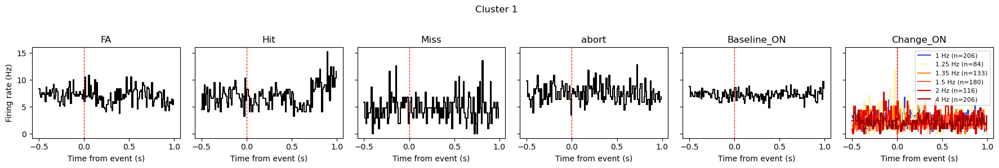

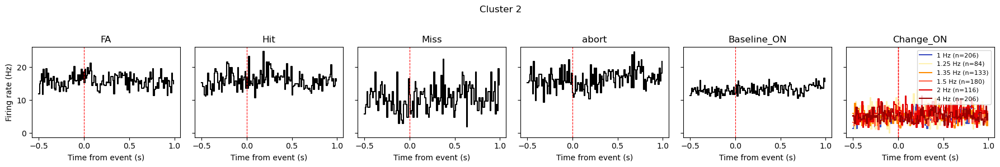

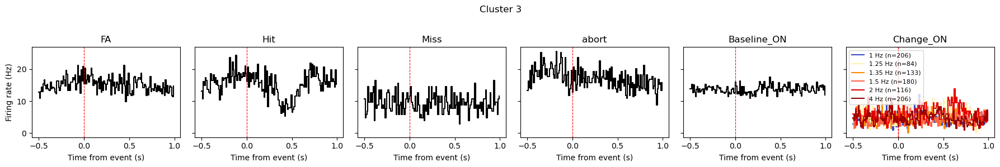

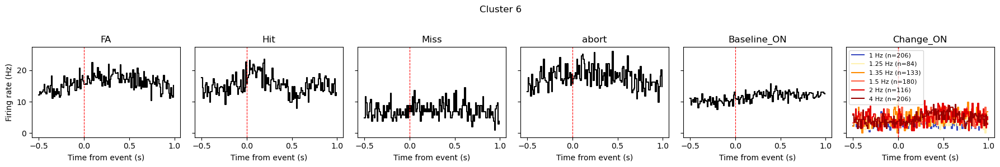

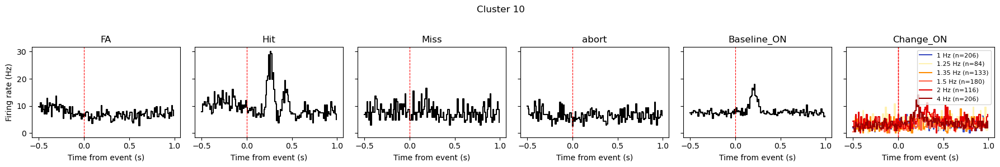

...

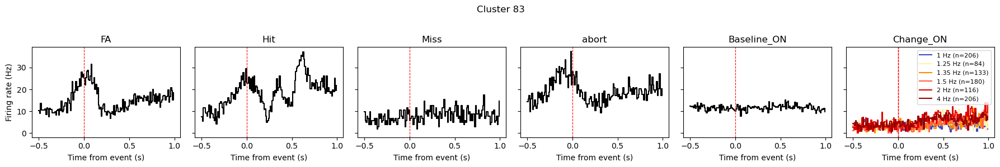

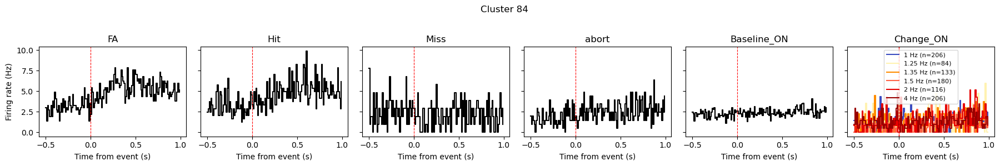

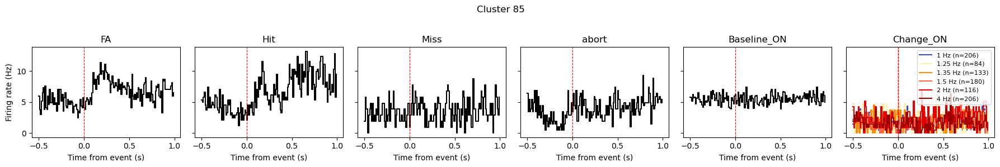

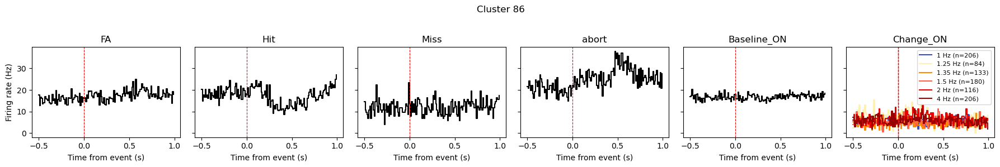

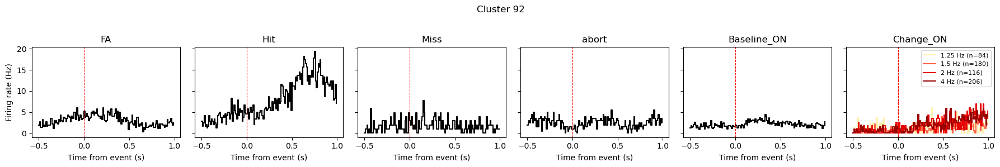

ZeroDivisionError: division by zero

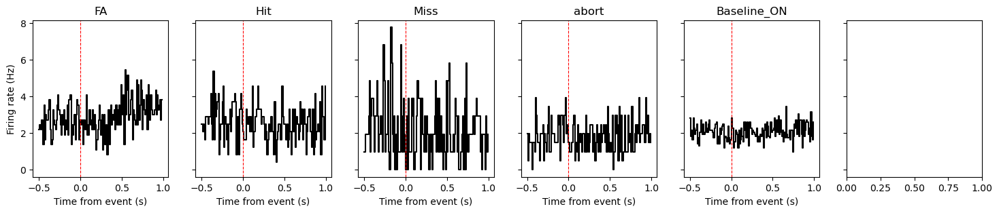

In [ ]:
plot_psth_per_cluster_per_outcome(session, show_fig=True)

In [ ]:
from scipy.ndimage import gaussian_filter1d

def plot_psth_per_cluster_per_outcome_advanced(
    session,
    window=(-0.5, 1.0),
    bin_size=0.01,
    good_cluster_ids=None,
    output_dir='png_output',
    show_fig=False,
    min_trials_with_spikes=30,
    shift_fa_hit_ms=200.0,
    sigma=3,  # smoothing for PSTH
    change_size_colors=None
):
    """
    For each good cluster, plot PSTHs for:
    - Each behavioral outcome (FA, Hit, Miss, abort)
    - Change_ON, split by outcome (Hit, abort), and by change size
    - Baseline_ON, split by outcome (Hit, FA, Miss, abort)
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt

    if change_size_colors is None:
        change_size_colors = {
            1.25: "#FFF2B1",
            1.35: "#ff8c00",
            1.5: "#ff6347",
            2.0: "#e60000",
            4.0: "#990000"
        }
    outcome_colors = {
        'FA': 'b',
        'Hit': 'g',
        'Miss': 'm',
        'abort': 'r'
    }
    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        print('NI_events not found in session. Cannot align to true event times.')
        return
    all_behav_outcomes = ['FA', 'Hit', 'Miss', 'abort']
    change_on_outcomes = ['Hit', 'Miss']
    baseline_on_outcomes = ['Hit', 'FA', 'Miss', 'abort']
    # Build list of all subplots
    subplot_labels = all_behav_outcomes + \
        [f'Change_ON-{o}' for o in change_on_outcomes] + \
        [f'Baseline_ON-{o}' for o in baseline_on_outcomes]
    n_subplots = len(subplot_labels)
    bins = np.arange(window[0], window[1] + bin_size, bin_size)
    if good_cluster_ids is None:
        if hasattr(session, 'good_cluster_ids') and session.good_cluster_ids is not None:
            good_cluster_ids = list(session.good_cluster_ids)
        else:
            good_cluster_ids = [c.cluster_id for c in session.clusters]
    os.makedirs(output_dir, exist_ok=True)
    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue
        psth_data = []
        n_trials_data = []
        # 1. Behavioral outcomes
        for outcome in all_behav_outcomes:
            event_times = []
            for idx, t in enumerate(session.trials):
                if t.trialoutcome == outcome:
                    et = get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                    if et is not None and not np.isnan(et):
                        event_times.append(et)
            all_counts = []
            for t_event in event_times:
                aligned_spikes = cluster.spike_times - t_event
                mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
                all_counts.append(smoothed_counts)
            if len(all_counts) == 0:
                all_counts = np.empty((0, len(bins)-1))
            else:
                all_counts = np.atleast_2d(np.array(all_counts))
            psth_data.append(all_counts)
            n_trials_data.append(len(event_times))
        # 2. Change_ON split by outcome and change size
        change_on = ni_events['Change_ON']
        if isinstance(change_on, dict) and 'rise_t' in change_on:
            change_on_times = np.array(change_on['rise_t']).flatten()
        else:
            change_on_times = np.array(change_on).flatten()
        for outcome in change_on_outcomes:
            # For each change size, plot a line
            change_sizes = sorted(set(t.change_size for t in session.trials if t.change_size is not None))
            psth_by_size = {}
            n_trials_by_size = {}
            for cs in change_sizes:
                # Get indices of trials with this outcome and change size
                trial_indices = [i for i, t in enumerate(session.trials) if t.trialoutcome == outcome and t.change_size == cs]
                event_times = change_on_times[trial_indices] if len(trial_indices) > 0 else []
                all_counts = []
                for t_event in event_times:
                    aligned_spikes = cluster.spike_times - t_event
                    mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                    counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                    smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
                    all_counts.append(smoothed_counts)
                if len(all_counts) == 0:
                    mean_psth = np.zeros(len(bins)-1)
                else:
                    mean_psth = np.mean(np.array(all_counts), axis=0) / bin_size  # Convert to Hz
                psth_by_size[cs] = mean_psth
                n_trials_by_size[cs] = len(event_times)
            psth_data.append(psth_by_size)
            n_trials_data.append(n_trials_by_size)
        # 3. Baseline_ON split by outcome
        baseline_on = ni_events['Baseline_ON']
        if isinstance(baseline_on, dict) and 'rise_t' in baseline_on:
            baseline_on_times = np.array(baseline_on['rise_t']).flatten()
        else:
            baseline_on_times = np.array(baseline_on).flatten()
        for outcome in baseline_on_outcomes:
            trial_indices = [i for i, t in enumerate(session.trials) if t.trialoutcome == outcome]
            event_times = baseline_on_times[trial_indices] if len(trial_indices) > 0 else []
            all_counts = []
            for t_event in event_times:
                aligned_spikes = cluster.spike_times - t_event
                mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                smoothed_counts = gaussian_filter1d(counts, sigma=sigma)
                all_counts.append(smoothed_counts)
            if len(all_counts) == 0:
                all_counts = np.empty((0, len(bins)-1))
            else:
                all_counts = np.atleast_2d(np.array(all_counts))
            psth_data.append(all_counts)
            n_trials_data.append(len(event_times))
        # Check if we have enough spikes for any of the outcomes
        enough_spikes = False
        for i, counts in enumerate(psth_data):
            if isinstance(counts, dict):
                # Change_ON split by size
                if any(n >= min_trials_with_spikes for n in n_trials_data[i].values()):
                    enough_spikes = True
            else:
                # Regular outcomes
                if counts.shape[0] > 0 and np.sum(np.sum(counts, axis=1) > 0) >= min_trials_with_spikes:
                    enough_spikes = True
        if not enough_spikes:
            continue
        # Plotting
        fig, axes = plt.subplots(1, n_subplots, figsize=(4*n_subplots, 3), sharey=False)
        if n_subplots == 1:
            axes = [axes]
        for i, (label, data, n_trials) in enumerate(zip(subplot_labels, psth_data, n_trials_data)):
            ax = axes[i]
            if label.startswith('Change_ON'):
                # Multiple lines for each change size
                for cs in sorted(data.keys()):
                    if cs == 1:  # No change
                        color = 'b'
                    else:
                        color = change_size_colors.get(cs, 'k')
                    ax.plot(bins[:-1], data[cs], color=color, label=f'{cs} Hz (n={n_trials[cs]})')
                ax.legend(fontsize=8)
            else:
                # Single mean PSTH
                if data.shape[0] > 0:
                    mean_psth = np.mean(data, axis=0) / bin_size  # Convert to Hz
                    # Use outcome color if available
                    outcome = label.split('-')[-1] if '-' in label else label
                    color = outcome_colors.get(outcome, 'k')
                    ax.step(bins[:-1], mean_psth, where='post', color=color)
            ax.axvline(0, color='r', linestyle='--', lw=0.8)
            ax.set_title(f'{label} (n={n_trials if isinstance(n_trials,int) else sum(n_trials.values())})')
            ax.set_xlabel('Time from event (s)')
            if i == 0:
                ax.set_ylabel('Firing rate (Hz)')
        fig.suptitle(f'Cluster {cluster.cluster_id}')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        save_path = os.path.join(output_dir, f'cluster_{cluster.cluster_id}_psth_advanced.png')
        plt.savefig(save_path, dpi=120)
        if show_fig:
            plt.show()
        plt.close(fig)

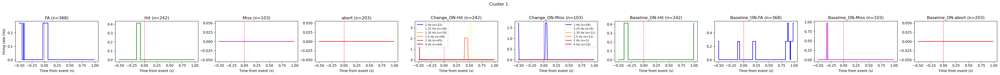

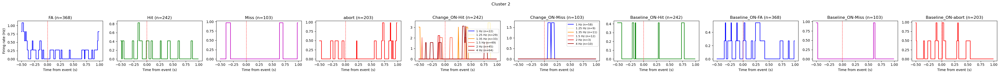

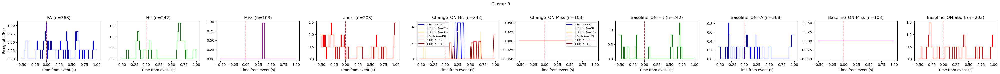

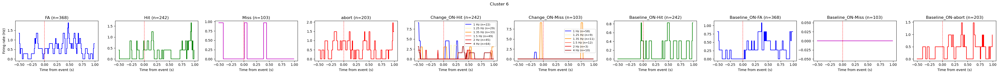

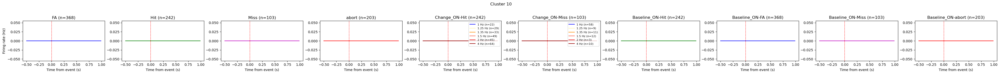

...

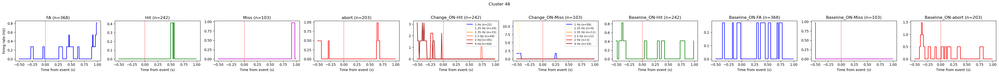

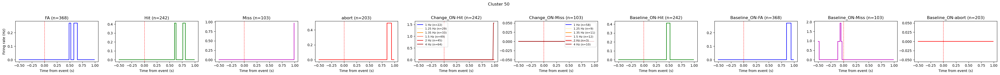

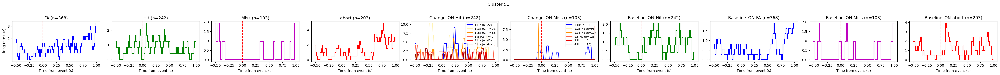

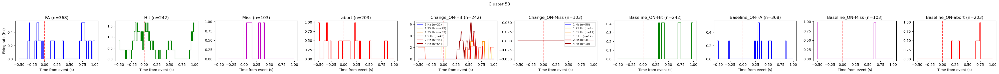

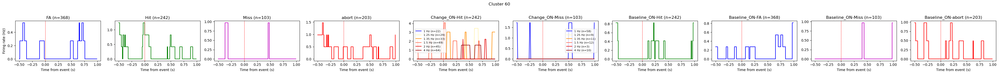

KeyboardInterrupt: 

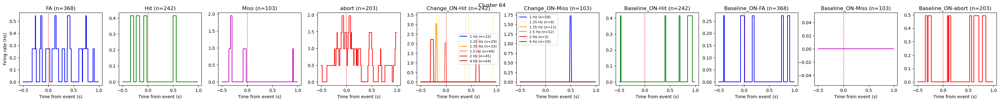

In [ ]:
plot_psth_per_cluster_per_outcome_advanced(session, show_fig=True)

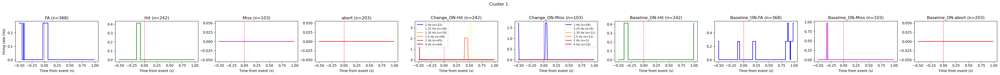

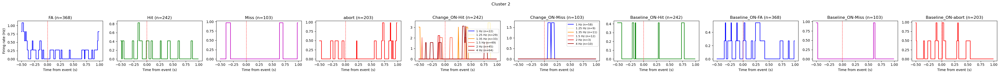

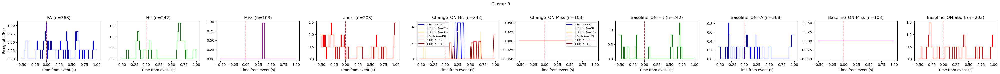

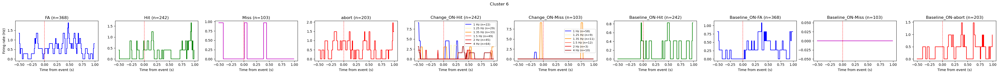

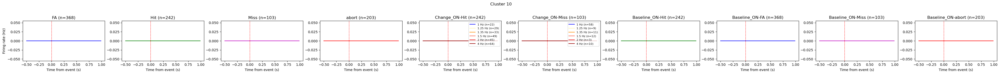

...

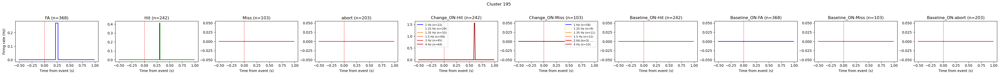

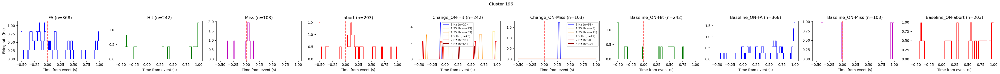

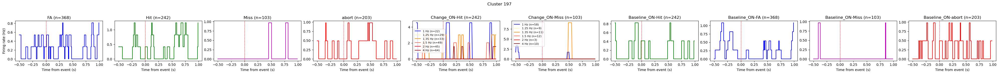

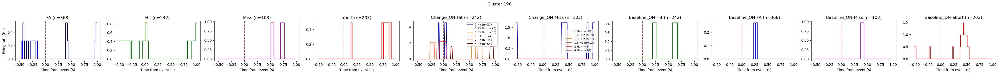

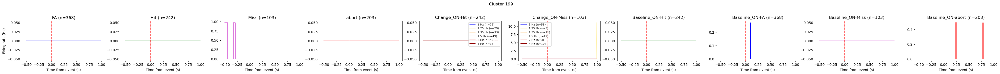

KeyboardInterrupt: 

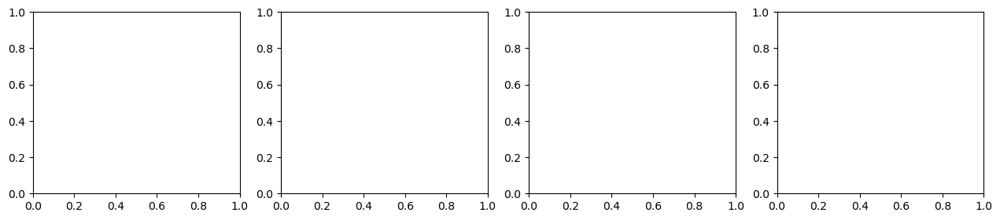

In [ ]:
plot_psth_per_cluster_per_outcome_advanced(session, show_fig=True)

c:\Users\Ben\anaconda3\envs\myenv\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Ben\anaconda3\envs\myenv\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


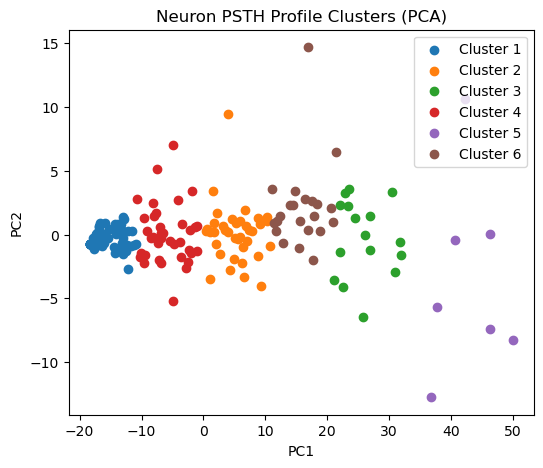

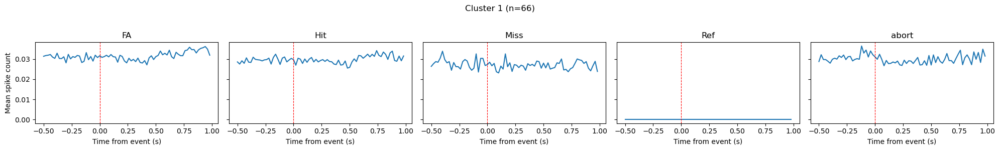

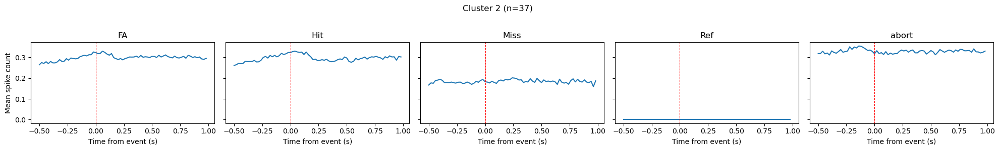

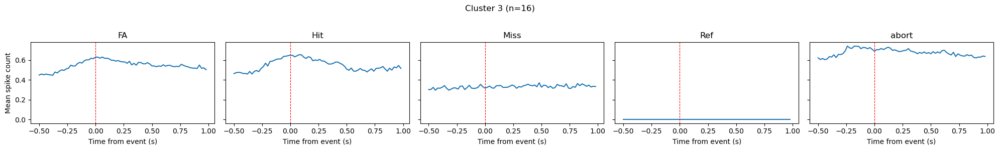

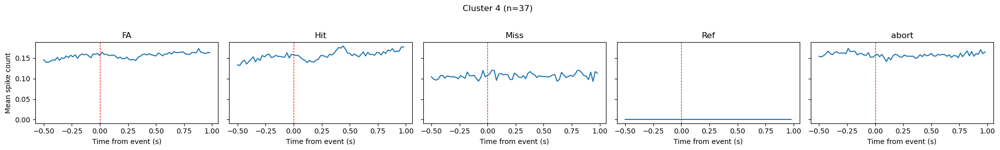

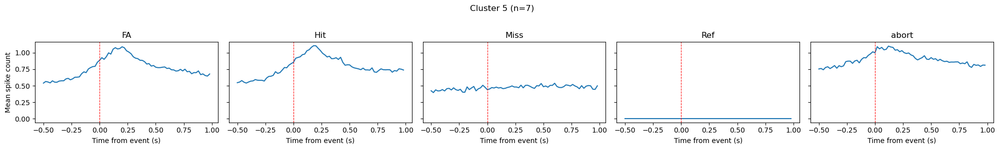

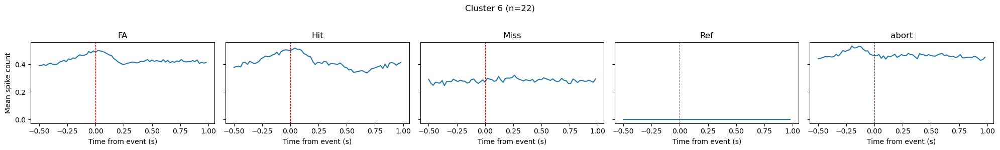

In [ ]:
# --- Feature Extraction and Clustering of Neuron PSTH Profiles ---
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# 1. Extract PSTH features for each cluster (concatenate mean PSTH for each outcome)
def extract_psth_features(session, outcomes=None, window=(-0.5, 1.0), bin_size=0.02, good_cluster_ids=None, shift_fa_hit_ms=200.0):
    ni_events = getattr(session, 'ni_events', None)
    if ni_events is None:
        raise ValueError('NI_events not found in session.')
    if outcomes is None:
        outcomes = sorted(set(t.trialoutcome for t in session.trials))
    if good_cluster_ids is None:
        good_cluster_ids = session.good_cluster_ids if session.good_cluster_ids is not None else [c.cluster_id for c in session.clusters]
    bins = np.arange(window[0], window[1] + bin_size, bin_size)
    features = []
    cluster_ids = []
    for cluster in session.clusters:
        if cluster.cluster_id not in good_cluster_ids:
            continue
        cluster_profile = []
        for outcome in outcomes:
            event_times = [
                get_true_reaction_time(t, ni_events, idx, shift_fa_hit_ms=shift_fa_hit_ms)
                for idx, t in enumerate(session.trials) if t.trialoutcome == outcome
            ]
            event_times = [et for et in event_times if et is not None and not np.isnan(et)]
            all_counts = []
            for t_event in event_times:
                aligned_spikes = cluster.spike_times - t_event
                mask = (aligned_spikes >= window[0]) & (aligned_spikes <= window[1])
                counts, _ = np.histogram(aligned_spikes[mask], bins=bins)
                all_counts.append(counts)
            if len(all_counts) == 0:
                mean_psth = np.zeros(len(bins)-1)
            else:
                mean_psth = np.mean(np.array(all_counts), axis=0)
            cluster_profile.append(mean_psth)
        # Concatenate all outcomes for this cluster
        features.append(np.concatenate(cluster_profile))
        cluster_ids.append(cluster.cluster_id)
    return np.array(features), cluster_ids, outcomes, bins

# 2. Run clustering (k-means) and visualize
features, cluster_ids, outcomes, bins = extract_psth_features(session)

# Normalize features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Optionally reduce dimensionality for visualization
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_scaled)

# Choose number of clusters (e.g., 4)
n_clusters = 6
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
labels = kmeans.fit_predict(features_scaled)

# Plot clusters in PCA space
plt.figure(figsize=(6,5))
for i in range(n_clusters):
    plt.scatter(features_pca[labels==i,0], features_pca[labels==i,1], label=f'Cluster {i+1}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Neuron PSTH Profile Clusters (PCA)')
plt.legend()
plt.show()

# Plot average PSTH per cluster (per outcome)
for i in range(n_clusters):
    idxs = np.where(labels == i)[0]
    if len(idxs) == 0:
        continue
    mean_profile = np.mean(features[idxs], axis=0)
    fig, axes = plt.subplots(1, len(outcomes), figsize=(4*len(outcomes), 3), sharey=True)
    if len(outcomes) == 1:
        axes = [axes]
    split = np.array_split(mean_profile, len(outcomes))
    for j, (ax, psth) in enumerate(zip(axes, split)):
        ax.plot(bins[:-1], psth)
        ax.axvline(0, color='r', linestyle='--', lw=0.8)
        ax.set_title(f'{outcomes[j]}')
        ax.set_xlabel('Time from event (s)')
        if j == 0:
            ax.set_ylabel('Mean spike count')
    fig.suptitle(f'Cluster {i+1} (n={len(idxs)})')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

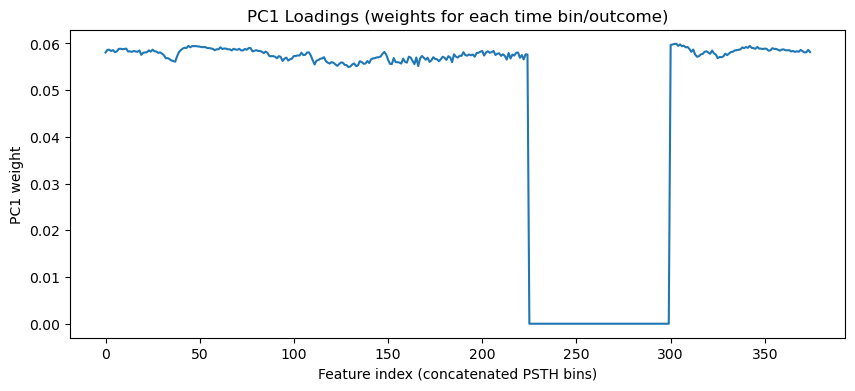

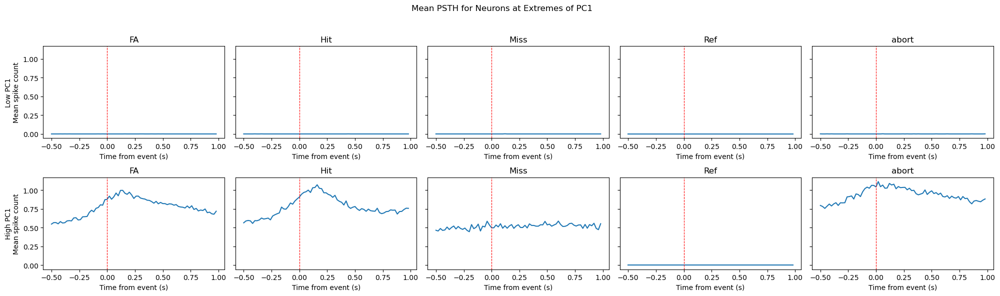

In [ ]:
# --- Inspect PC1 loadings and plot mean PSTH for extremes ---
import matplotlib.pyplot as plt
import numpy as np

# 1. Inspect PC1 loadings
plt.figure(figsize=(10,4))
plt.plot(pca.components_[0])
plt.title('PC1 Loadings (weights for each time bin/outcome)')
plt.xlabel('Feature index (concatenated PSTH bins)')
plt.ylabel('PC1 weight')
plt.show()

# 2. Plot mean PSTH for neurons at the extremes of PC1
n_extreme = 10  # number of neurons at each extreme
pc1_scores = features_scaled @ pca.components_[0]
idx_low = np.argsort(pc1_scores)[:n_extreme]
idx_high = np.argsort(pc1_scores)[-n_extreme:]

# Helper to plot mean PSTH split by outcome
fig, axes = plt.subplots(2, len(outcomes), figsize=(4*len(outcomes), 6), sharey=True)
for row, idxs, label in zip([0,1], [idx_low, idx_high], ['Low PC1', 'High PC1']):
    mean_profile = np.mean(features[idxs], axis=0)
    split = np.array_split(mean_profile, len(outcomes))
    for j, (ax, psth) in enumerate(zip(axes[row], split)):
        ax.plot(bins[:-1], psth)
        ax.axvline(0, color='r', linestyle='--', lw=0.8)
        ax.set_title(f'{outcomes[j]}')
        ax.set_xlabel('Time from event (s)')
        if j == 0:
            ax.set_ylabel(f'{label}\nMean spike count')
fig.suptitle('Mean PSTH for Neurons at Extremes of PC1')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
# Debug: Print keys and values of a few raw trial dicts to inspect available fields
def print_trial_keys_and_values(session, n=5):
    print('First', n, 'trials:')
    for i, t in enumerate(session.trials[:n]):
        print(f'--- Trial {i} ---')
        if hasattr(t, '__dict__'):
            for k, v in t.__dict__.items():
                print(f'{k}: {v}')
        else:
            print(t)
        print()
# Example usage:
print_trial_keys_and_values(session, n=5)

First 5 trials:
--- Trial 0 ---
trialoutcome: abort
reactiontimes: {'FA': nan, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': 2.039}
change_size: None
hit_time: None

--- Trial 1 ---
trialoutcome: FA
reactiontimes: {'FA': 0.967, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': nan}
change_size: None
hit_time: None

--- Trial 2 ---
trialoutcome: FA
reactiontimes: {'FA': 0.987, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': nan}
change_size: None
hit_time: None

--- Trial 3 ---
trialoutcome: FA
reactiontimes: {'FA': 2.749, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': nan}
change_size: None
hit_time: None

--- Trial 4 ---
trialoutcome: FA
reactiontimes: {'FA': 2.134, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': nan}
change_size: None
hit_time: None



In [ ]:
# Debug: Print keys and values of a few raw trial dicts to inspect available fields
def print_trial_keys_and_values(session, n=5):
    print('First', n, 'trials:')
    for i, t in enumerate(session.trials[:n]):
        print(f'--- Trial {i} ---')
        if hasattr(t, '__dict__'):
            for k, v in t.__dict__.items():
                print(f'{k}: {v}')
        else:
            print(t)
        print()
# Example usage:
# print_trial_keys_and_values(session, n=5)

In [ ]:
print_trial_keys_and_values(session, n=5)

First 5 trials:
--- Trial 0 ---
trialoutcome: abort
reactiontimes: {'FA': nan, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': 2.039}
change_size: None
hit_time: None

--- Trial 1 ---
trialoutcome: FA
reactiontimes: {'FA': 0.967, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': nan}
change_size: None
hit_time: None

--- Trial 2 ---
trialoutcome: FA
reactiontimes: {'FA': 0.987, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': nan}
change_size: None
hit_time: None

--- Trial 3 ---
trialoutcome: FA
reactiontimes: {'FA': 2.749, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': nan}
change_size: None
hit_time: None

--- Trial 4 ---
trialoutcome: FA
reactiontimes: {'FA': 2.134, 'RT': nan, 'Ref': nan, 'Miss': nan, 'gray': nan, 'abort': nan}
change_size: None
hit_time: None



In [ ]:
# Debug: Print keys and values of a few cluster dicts to inspect available fields
def print_cluster_keys_and_values(session, n=5):
    print('First', n, 'clusters:')
    for i, c in enumerate(session.clusters[:n]):
        print(f'--- Cluster {i} ---')
        if hasattr(c, '__dict__'):
            for k, v in c.__dict__.items():
                print(f'{k}: {v}')
        else:
            print(c)
        print()
# Example usage:
print_cluster_keys_and_values(session, n=5)

First 5 clusters:
--- Cluster 0 ---
cluster_id: 0
spike_times: [5.08403333e+00 1.31603667e+01 1.69087667e+01 ... 1.20735574e+04
 1.20737992e+04 1.20743168e+04]
quality: None

--- Cluster 1 ---
cluster_id: 1
spike_times: [4.74666667e-02 8.81966667e-01 1.00046667e+00 ... 1.20568988e+04
 1.20628048e+04 1.20647476e+04]
quality: None

--- Cluster 2 ---
cluster_id: 2
spike_times: [5.18666667e-02 7.27333333e-02 8.22000000e-02 ... 1.20744687e+04
 1.20744980e+04 1.20746650e+04]
quality: None

--- Cluster 3 ---
cluster_id: 3
spike_times: [2.72400000e-01 4.00833333e-01 8.08300000e-01 ... 1.20743849e+04
 1.20744426e+04 1.20746163e+04]
quality: None

--- Cluster 4 ---
cluster_id: 4
spike_times: [3.27000000e-02 3.92333333e-02 1.69000000e-01 ... 1.20742390e+04
 1.20744265e+04 1.20746322e+04]
quality: None

